In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
#import scipy.signal as sig
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from imagingIO import loopMice
from trials import markTrials
from bouts import markBouts
from statsmodels import robust

In [2]:
# Start running the analysis
mice = [(8404, 6), (8857, 3), (8864, 1)]
#mice = [(6838, 1), (6874, 1), (7104, 1), (7105, 1)]
behType = 'FR1'
fileList = loopMice(mice, behType)

In [3]:
fs = 0.05
base = 5.0
duration = 30.0
eventType = 'Eat_Start'
trials=[1,10]

In [4]:
eventsData = markTrials(mice, base, duration, eventType=eventType, behType=behType, trials=trials, baseline=base)

# Calculate the mean and sem
mean=eventsData.pivot_table(index=['Event', 'Cell'], columns='New_Time').mean()
sem=eventsData.pivot_table(index=['Event', 'Cell'], columns='New_Time').sem()
time = np.arange(-base,duration,fs)


3  mice were loaded.
Mouse number 8404  had  15  total rewards.
Mouse number 8857  had  17  total rewards.
Mouse number 8864  had  13  total rewards.


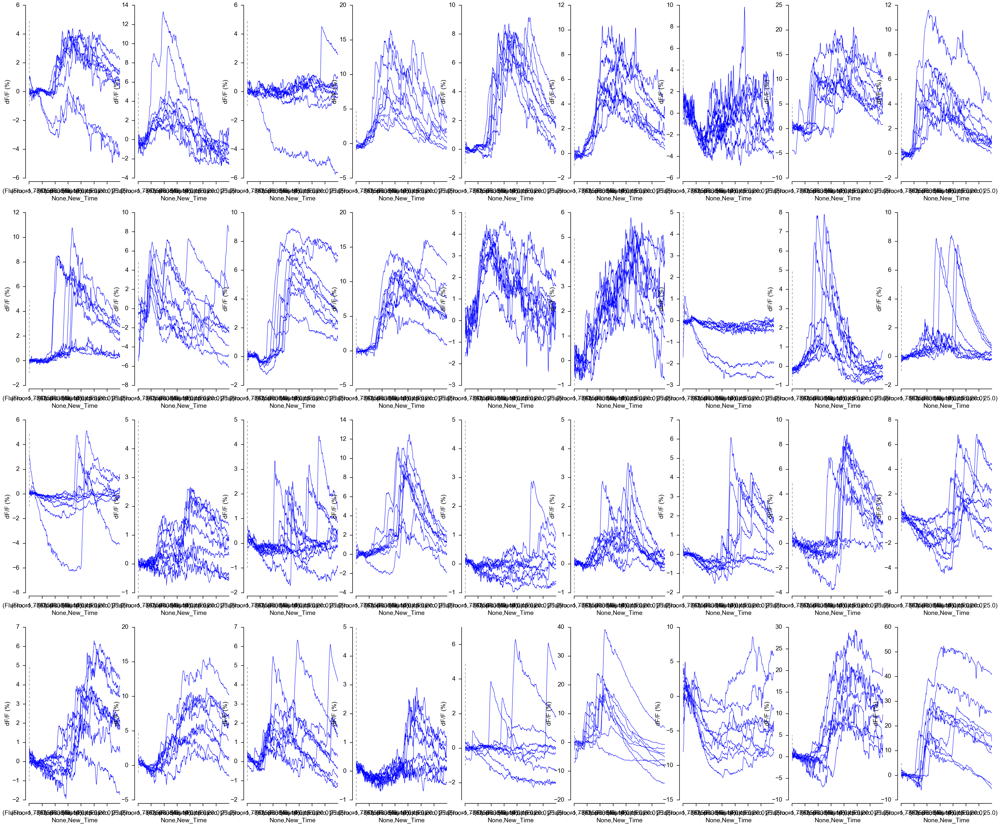

In [10]:
cellNames = eventsData['Cell'].drop_duplicates().values
row = 4
plt.figure(figsize=(50,40), facecolor="w", dpi= 150)
time = np.arange(-base,duration,fs)
for ind, cell in enumerate(cellNames):
    
    for i in range(1,10):
        plt.style.use('classic')
        # Set the font dictionaries (for plot title and axis titles)
        font = {'sans-serif' : 'Arial',
                'weight' : 'normal',
                'size'   : 18}
        plt.rc('font', **font)
        
        line = 1.5
        colors = ('#BCBEC0', '#0070C0', '#BCBEC0', '#0070C0')
    
        ax = plt.subplot(row, len(cellNames)/row, ind+1)
        
        ## labels
        ax.set_xlabel("Time (sec)")
        ax.set_ylabel("dF/F (%)")
        #ax.set_title("Aligned to event::Update the title", fontsize= 12)

        ## Remove top axes and right axes ticks
        ax.get_xaxis().tick_top()
        ax.get_yaxis().tick_left()
        
        ## Remove top axes and right axes ticks
        ax.get_xaxis().tick_top()
        ax.get_yaxis().tick_left()

        ## adjust the spines and ticks
        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.spines['left'].set_linewidth(line)
        ax.spines['left'].set_position(('outward', 10))
        ax.spines['bottom'].set_linewidth(line)
        ax.spines['bottom'].set_position(('outward', 10))
        ax.xaxis.set_ticks_position('bottom')
        ax.yaxis.set_ticks_position('left')

        ## decorate the axes
        ax.tick_params(axis='y', color= '#000000', width= line, direction='out', length= 8, which='major', pad=10)
        ax.tick_params(axis='x', color= '#000000', width= line, direction='out', length= 8, which='major', pad=12)
        
        ax.plot([0, 0],[-1, 5], 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)
        
        df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
        df.loc[cell,i].plot(legend=False, subplots=True)
        

In [24]:
cellNames = eventsData['Cell'].drop_duplicates().values
time = np.arange(-base,duration,fs)
for ind, cell in enumerate(cellNames):
    for i in range(1,10):       
        df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
        print df.loc[cell,i].mean(axis=0)
        

-2.03391848609
1.71696772079
1.56169513733
-1.89194176156
1.24918649844
1.55774825348
1.88967715608
2.21110952069
1.3376798745
4.27921577033
2.36850783662
0.826992882013
0.21278058399


KeyboardInterrupt: 

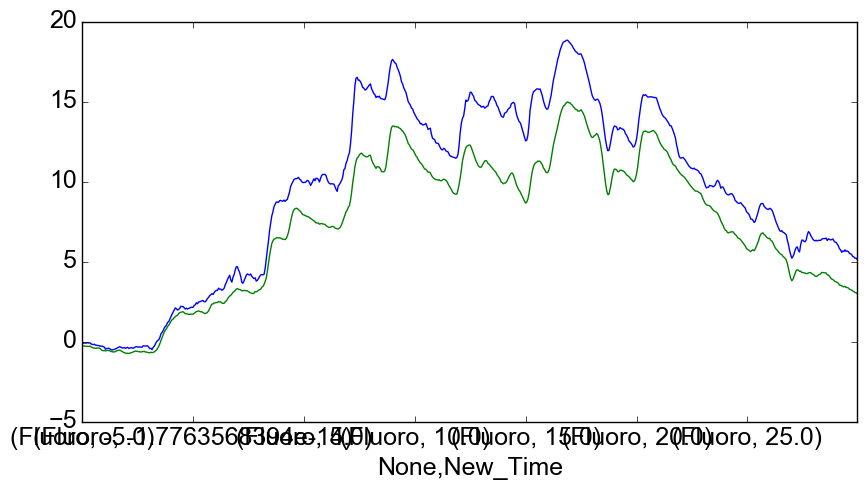

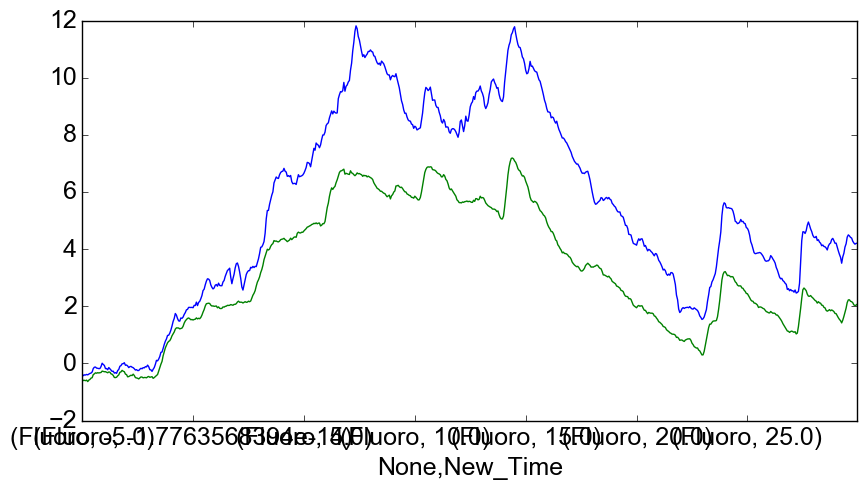

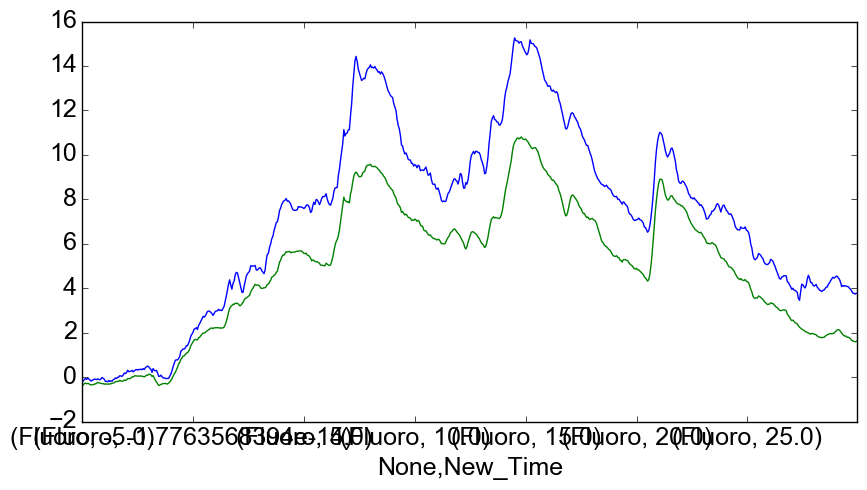

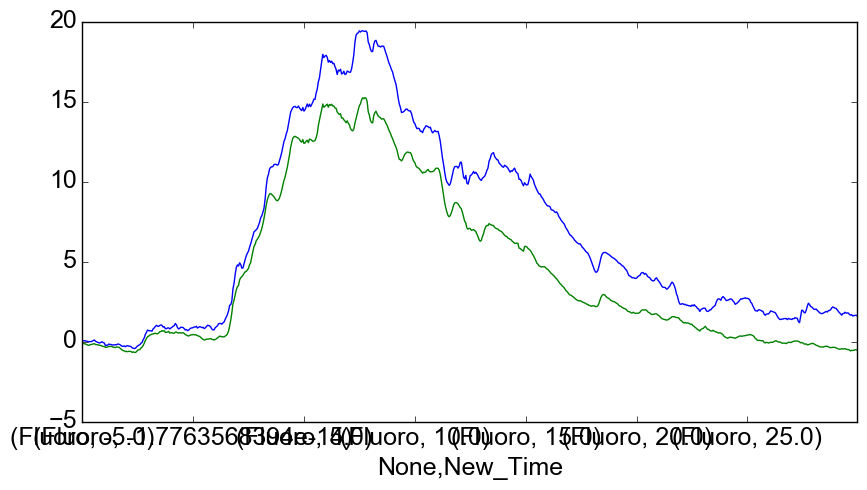

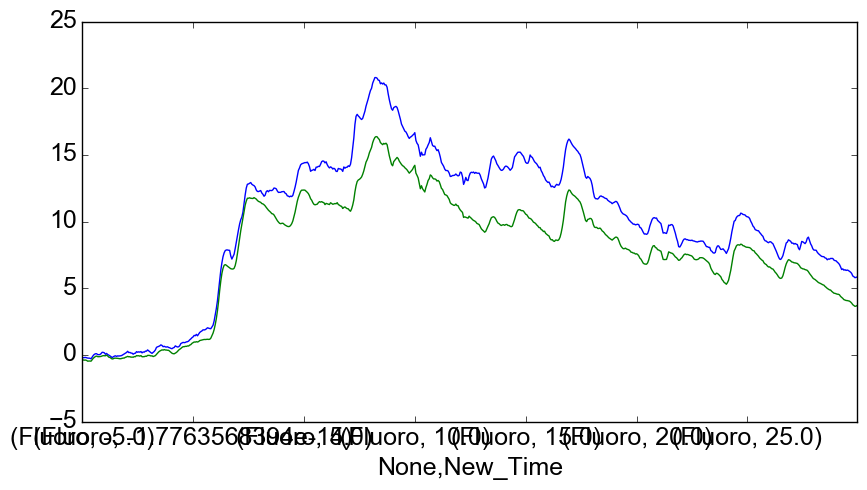

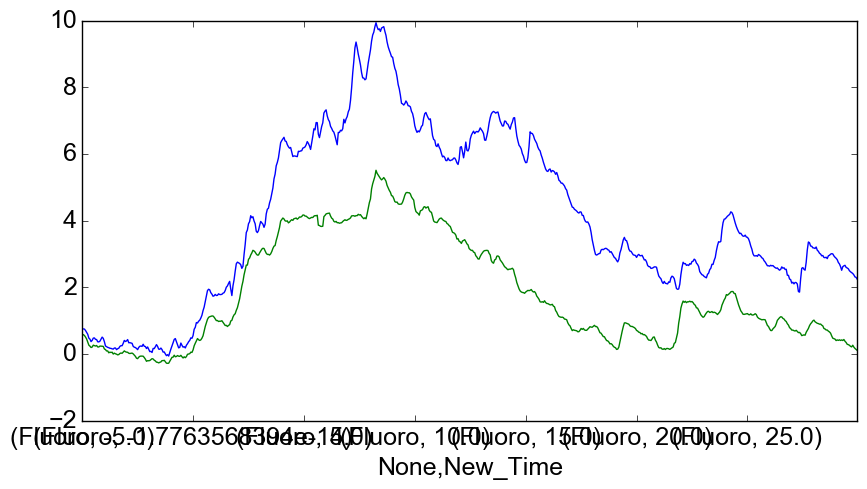

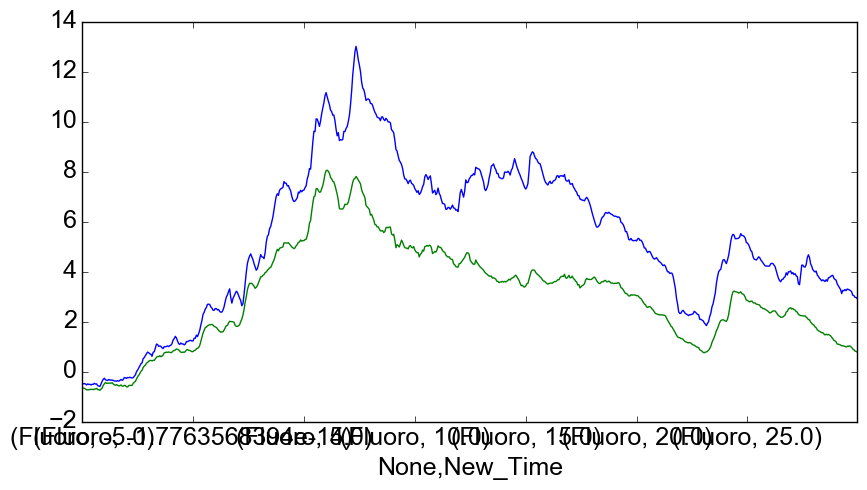

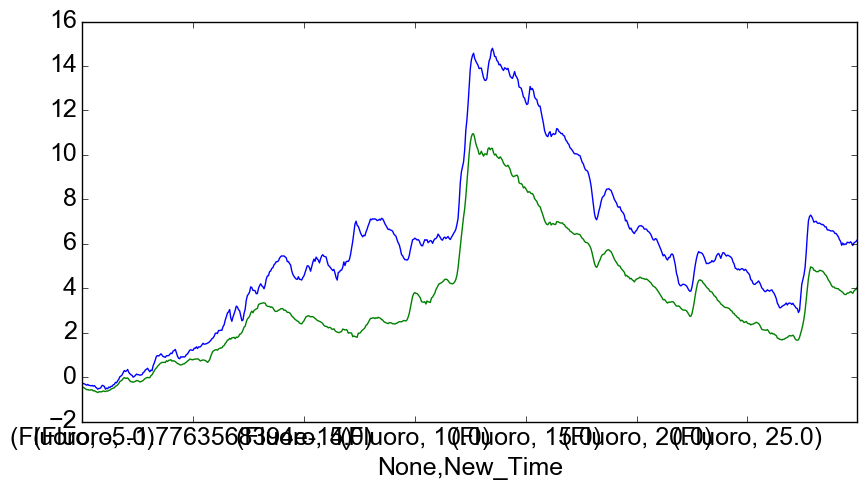

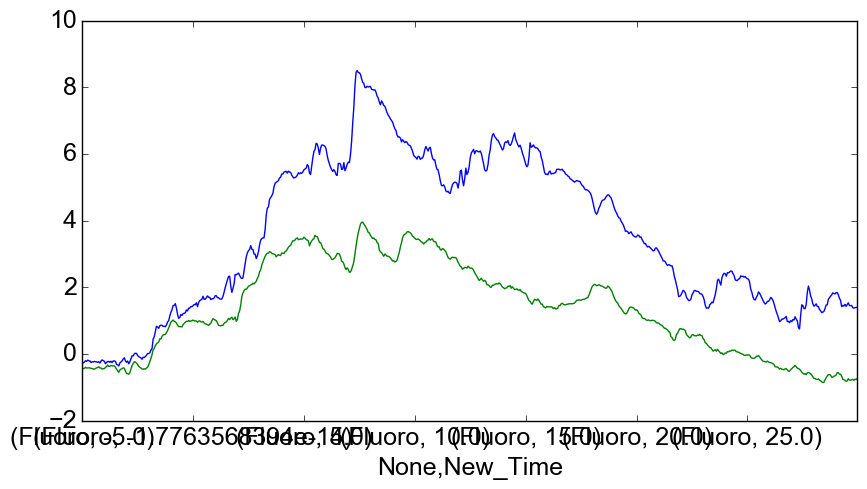

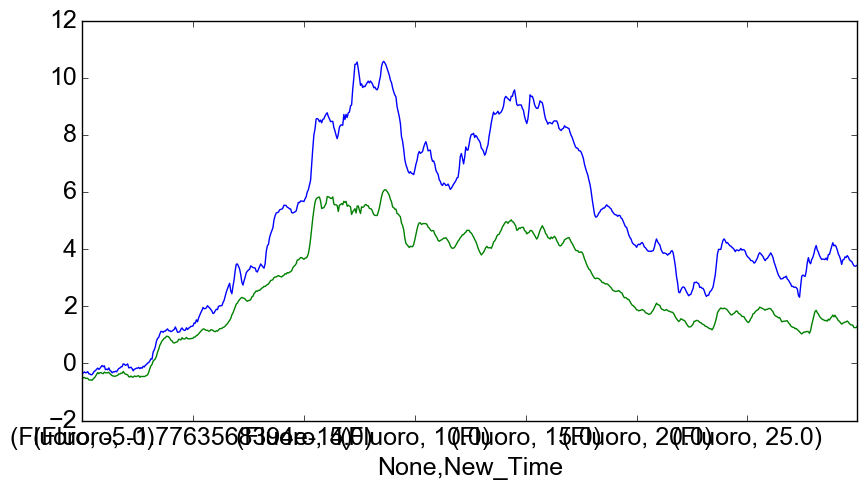

In [39]:
cellNames = eventsData['Cell'].drop_duplicates().values
time = np.arange(-base,duration,fs)

df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
a = robust.mad(df.loc[cellNames[3]], axis=0)
adf = df.loc[cellNames[3]] + a
for i in np.arange(1,11):
    plt.figure(figsize=(10,5), facecolor="w", dpi= 150)
    adf.loc[i].plot()
    df.loc[cellNames[3]].loc[i].plot()

M8404_recording_ICs29 (Fluorescence (au))
        New_Time
Fluoro  -5.00      -0.237621
         0.70       0.890720
         0.75       1.008538
         4.40       7.874954
         4.45       8.026433
         26.15      8.039964
         26.20      7.894425
         26.35      7.920496
         26.40      8.110919
Name: 1, dtype: float64
        New_Time     
Fluoro  -5.000000e+00   -0.772656
        -3.800000e+00   -0.281915
        -3.750000e+00   -0.249903
        -3.700000e+00   -0.265744
        -3.650000e+00   -0.249572
        -3.150000e+00   -0.239342
        -3.100000e+00   -0.264093
        -2.800000e+00   -0.261783
        -2.750000e+00   -0.212940
        -2.350000e+00   -0.176308
        -2.300000e+00   -0.250893
        -2.250000e+00   -0.249242
        -2.200000e+00   -0.271354
        -1.700000e+00   -0.268054
        -1.650000e+00   -0.226141
        -5.000000e-02    0.227308
        -1.776357e-14    0.251069
         1.000000e-01    0.259320
         1.500000e-01 

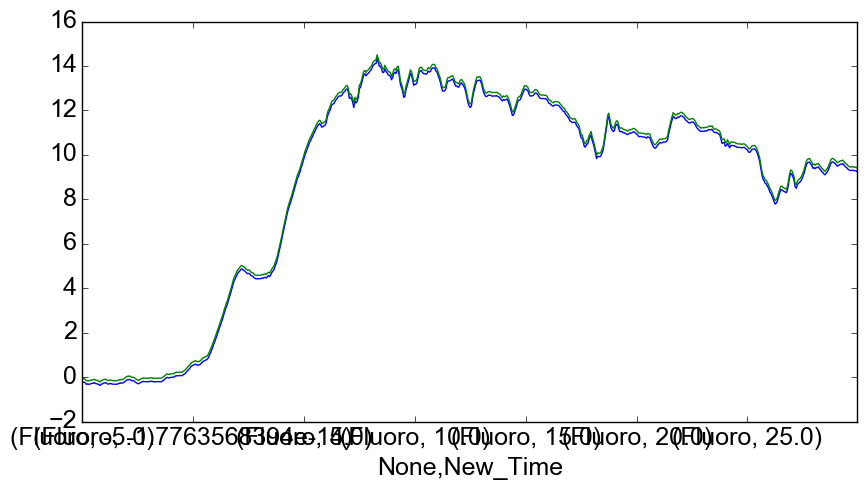

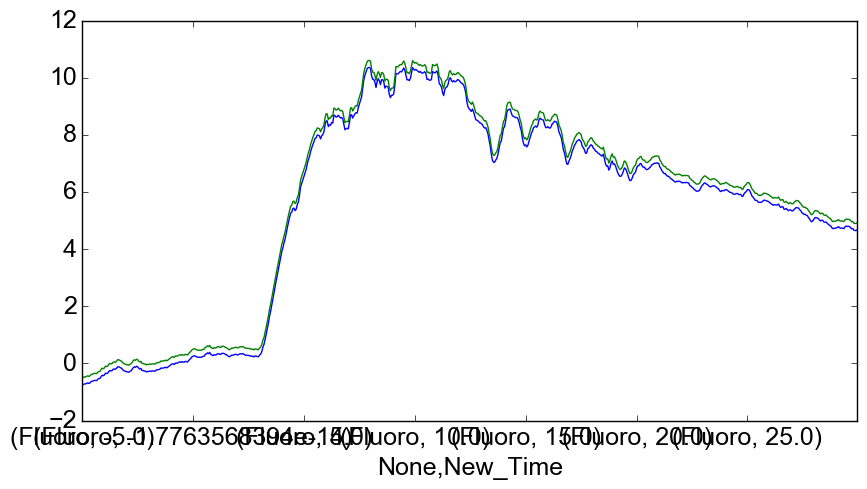

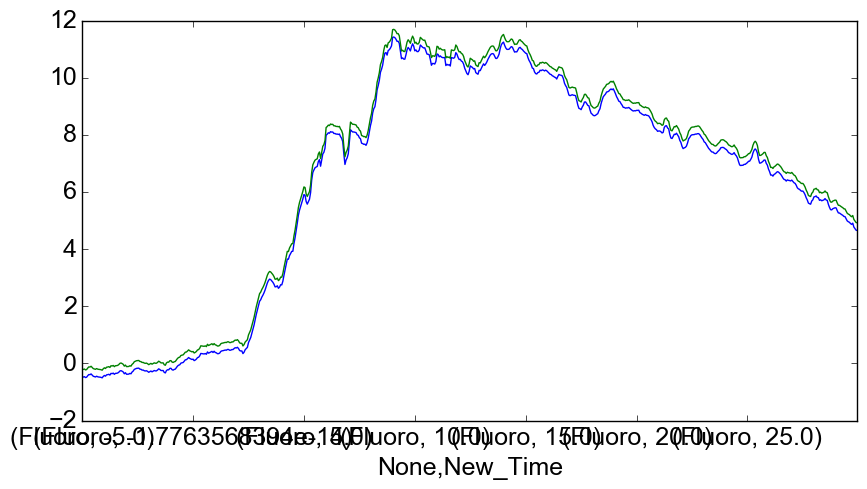

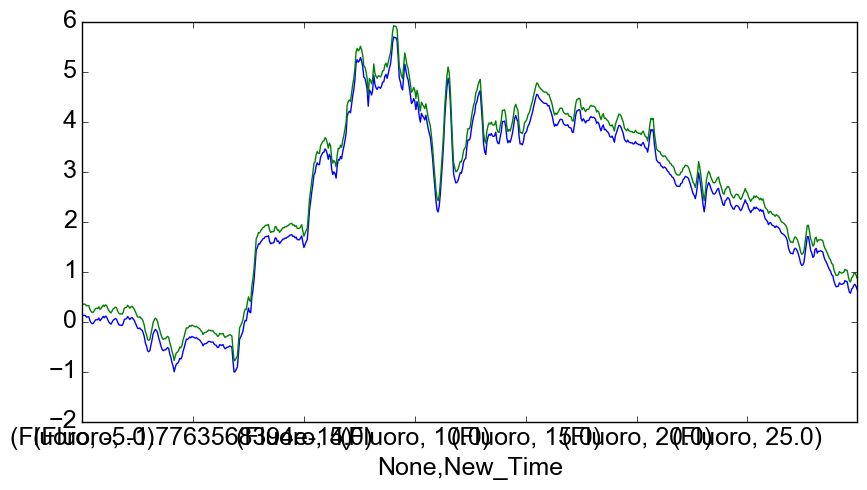

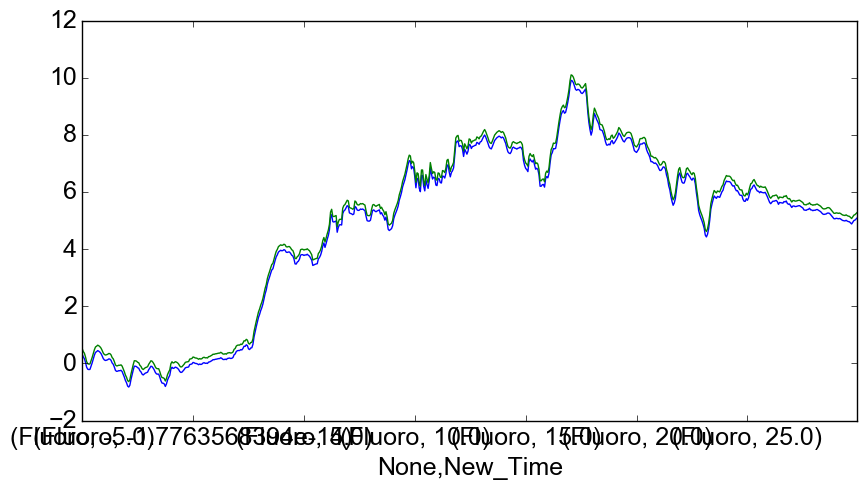

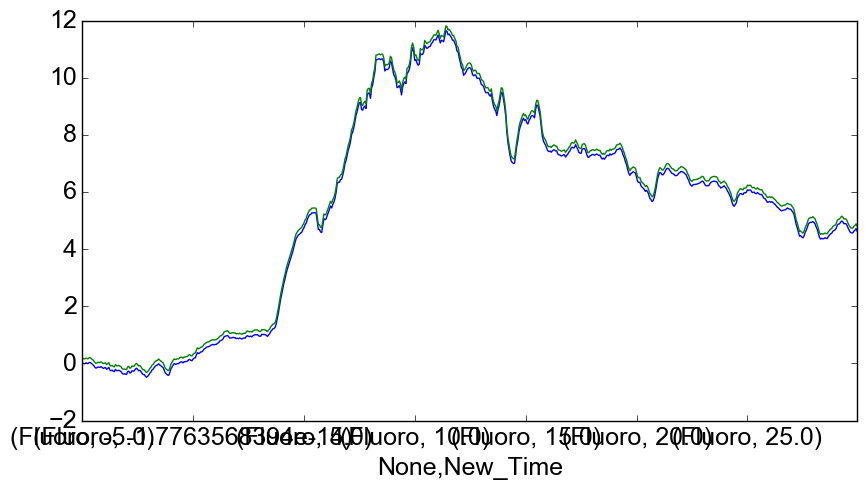

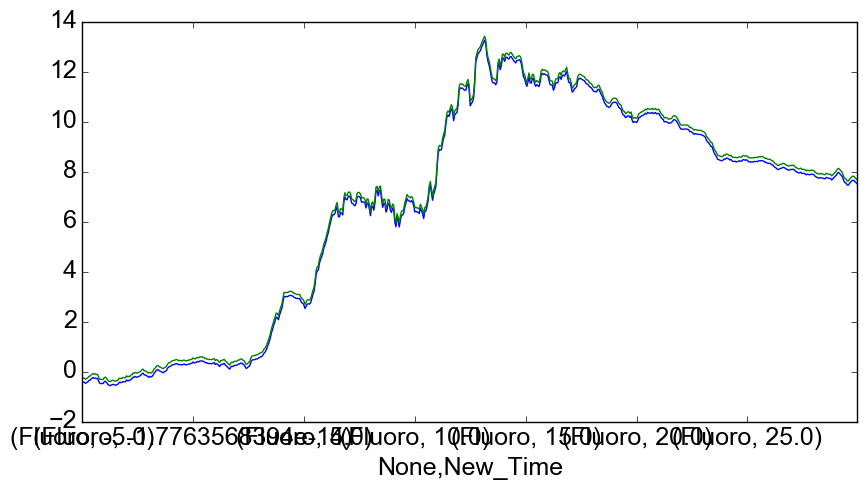

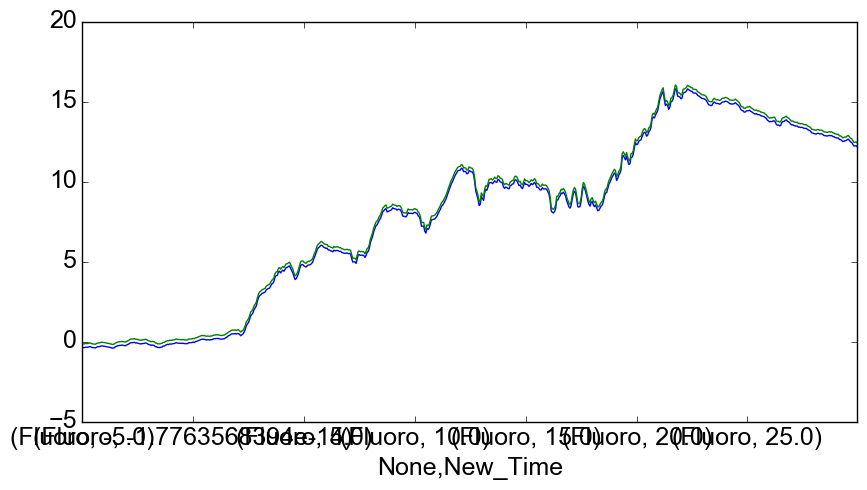

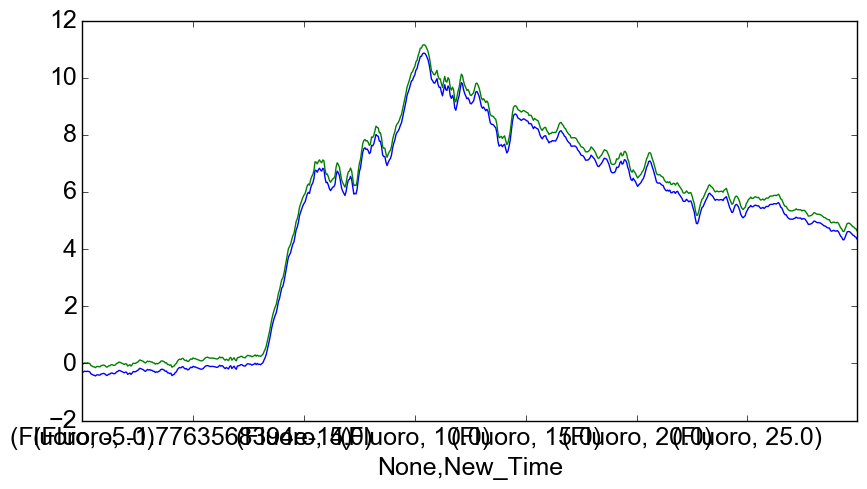

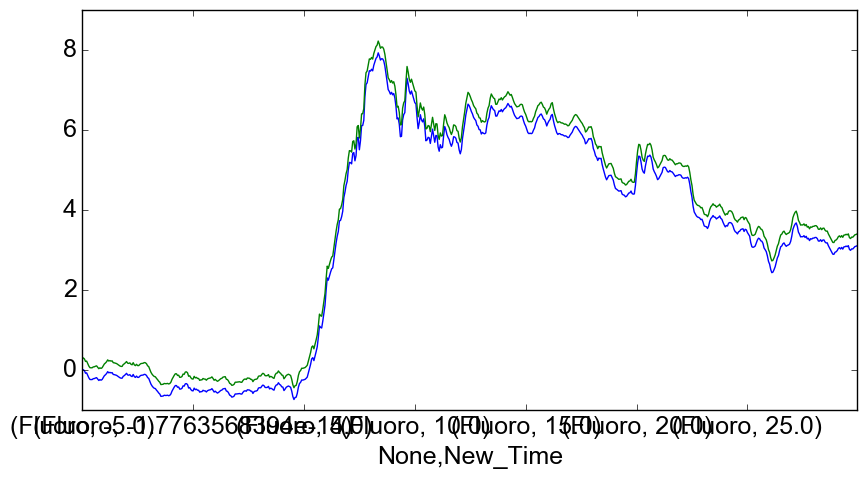

In [61]:
cellNames = eventsData['Cell'].drop_duplicates().values
time = np.arange(-base,duration,fs)
ind = 12
print cellNames[ind]

df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
a = robust.mad(df.loc[cellNames[13]], axis=1)
for i in np.arange(1,11):
    plt.figure(figsize=(10,5), facecolor="w", dpi= 150)
    (df.loc[cellNames[ind]].loc[i] - a[i-1]*0.2).plot()
    df.loc[cellNames[ind]].loc[i].plot()
    dfDiff = (df.loc[cellNames[ind]].loc[i] - a[i-1]*0.2) - df.loc[cellNames[ind]].loc[i]
    dfDiff.diff()
    zero_crossings = np.where(np.diff(np.sign(dfDiff.diff())))[0]
    print (df.loc[cellNames[ind]].loc[i] - a[i-1]*0.2)[zero_crossings]

In [30]:
robust.mad(df.loc[cellNames[3]], axis=0)

array([ 0.18822192,  0.16980907,  0.19152458,  0.19741943,  0.20083505,
        0.23403407,  0.21140594,  0.20960746,  0.17720512,  0.20035942,
        0.21208372,  0.23170348,  0.20071317,  0.17937816,  0.15464834,
        0.15232667,  0.14815004,  0.20790114,  0.27590741,  0.24128744,
        0.2201189 ,  0.10890456,  0.12802789,  0.10619644,  0.15343251,
        0.1162263 ,  0.12426743,  0.1006702 ,  0.14828083,  0.15282013,
        0.17345062,  0.13650006,  0.18524031,  0.18897401,  0.21234829,
        0.21975921,  0.22899536,  0.2652622 ,  0.31369032,  0.30896077,
        0.33558419,  0.38114069,  0.31402623,  0.32465955,  0.30948693,
        0.29306876,  0.22664991,  0.23698893,  0.26413555,  0.29279527,
        0.2700512 ,  0.29349385,  0.30188873,  0.30258731,  0.29215317,
        0.35814692,  0.33605982,  0.38036482,  0.38197007,  0.41199426,
        0.34022159,  0.26709338,  0.24791654,  0.18515113,  0.31735267,
        0.34983825,  0.4265337 ,  0.52638641,  0.47724782,  0.41

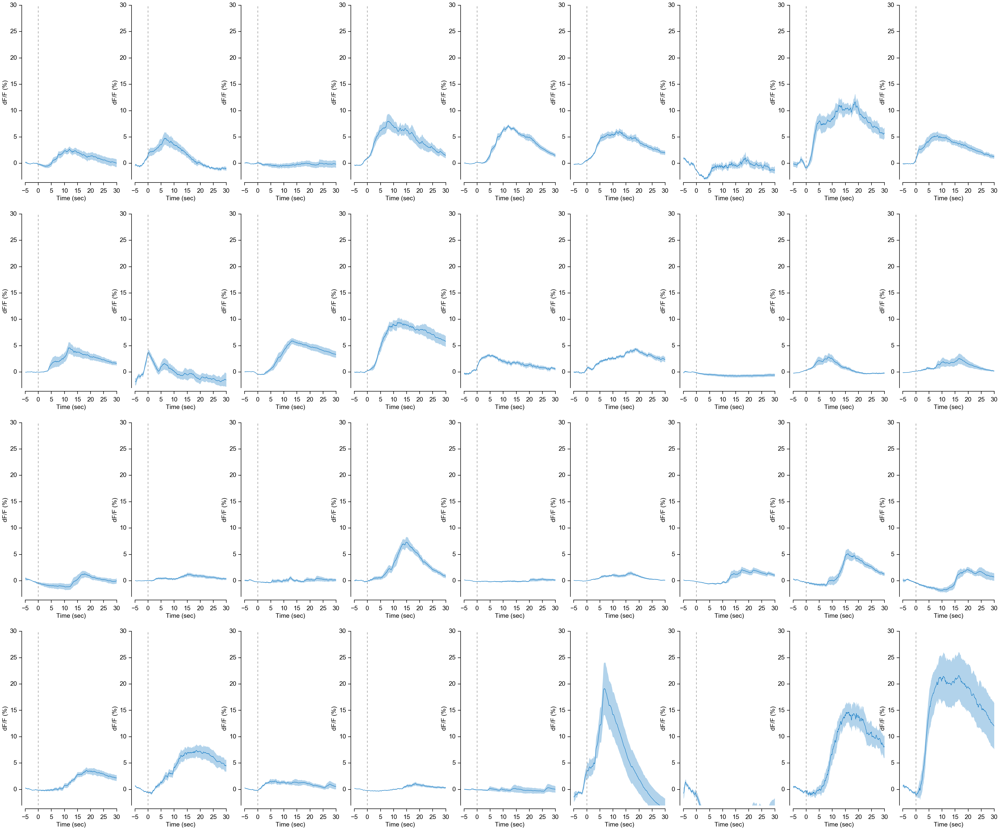

In [32]:
cellNames = eventsData['Cell'].drop_duplicates().values
time = np.arange(-base,duration,fs)

row = 4
plt.figure(figsize=(50,40), facecolor="w", dpi= 150)
for ind, cell in enumerate(cellNames):
    df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
    semCell = df.loc[cell].sem(axis=0)
    meanCell = df.loc[cell].mean(axis=0)
    
    plt.style.use('classic')
    # Set the font dictionaries (for plot title and axis titles)
    font = {'sans-serif' : 'Arial',
            'weight' : 'normal',
            'size'   : 18}
    plt.rc('font', **font)

    line = 1.5
    colors = ('#BCBEC0', '#0070C0', '#BCBEC0', '#0070C0')
    
    ax = plt.subplot(row, len(cellNames)/row, ind+1)
    
    ## labels
    ax.set_xlabel("Time (sec)")
    ax.set_ylabel("dF/F (%)")
    #ax.set_title("Aligned to event::Update the title", fontsize= 12)

    ## Remove top axes and right axes ticks
    ax.get_xaxis().tick_top()
    ax.get_yaxis().tick_left()

    ## adjust the spines and ticks
    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.spines['left'].set_linewidth(line)
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_linewidth(line)
    ax.spines['bottom'].set_position(('outward', 10))
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')

    ## decorate the axes
    ax.tick_params(axis='y', color= '#000000', width= line, direction='out', length= 8, which='major', pad=10)
    ax.tick_params(axis='x', color= '#000000', width= line, direction='out', length= 8, which='major', pad=12)

    ax.fill_between(time, meanCell+semCell, meanCell-semCell, facecolor=colors[1], linewidth=0, alpha=0.3, zorder=-5)
    cat, = ax.plot(time, meanCell, colors[1], label=eventType)    
    
    # limits
    lims = [-3, 30]
    ax.set_ylim(lims)
    
    ax.plot([0, 0],lims, 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)

In [ ]:
df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')

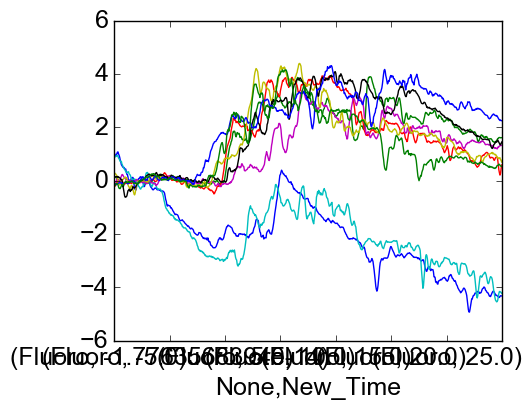

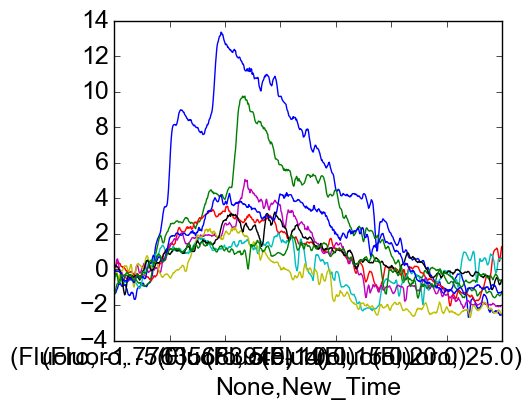

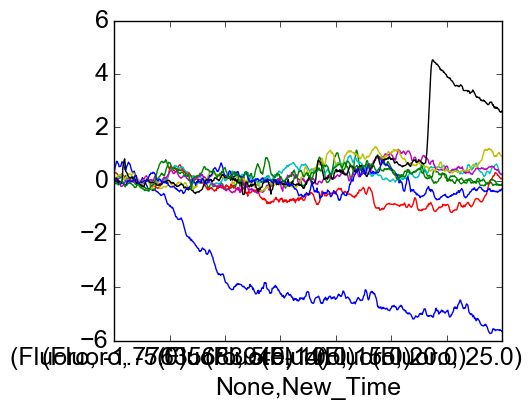

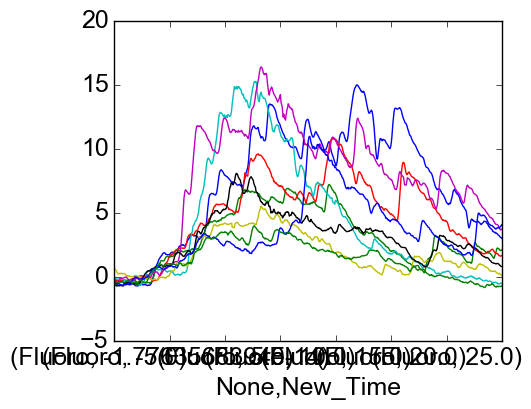

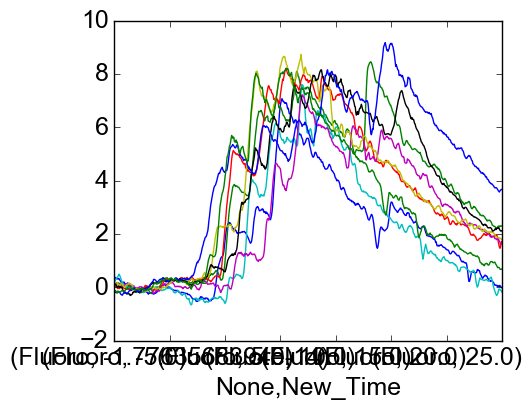

...

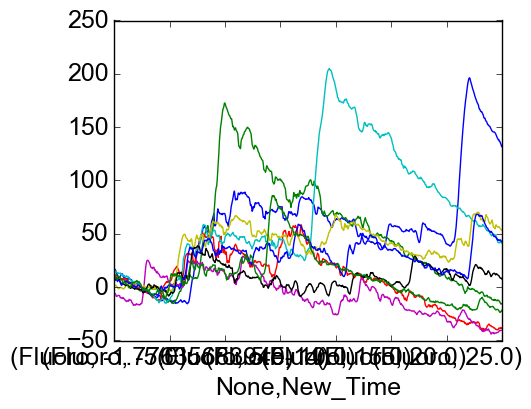

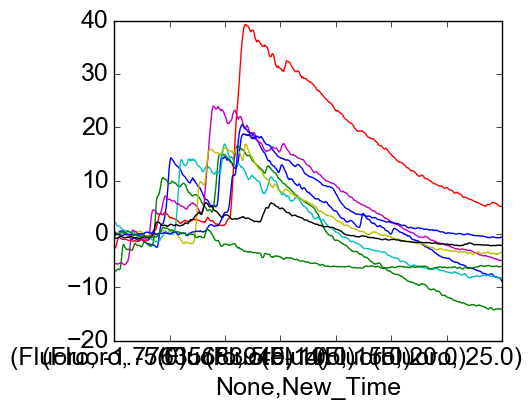

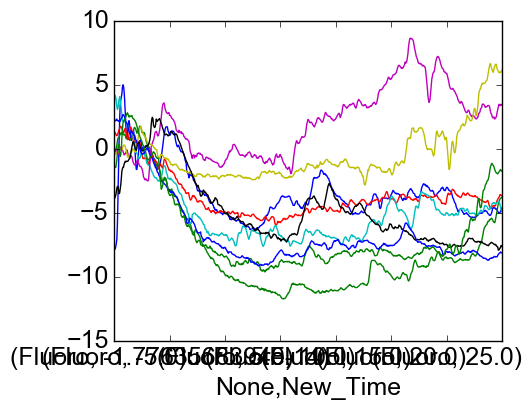

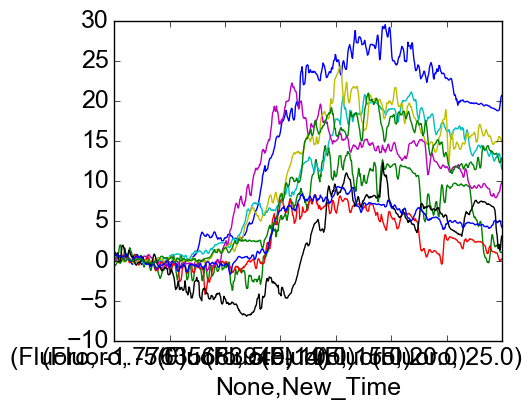

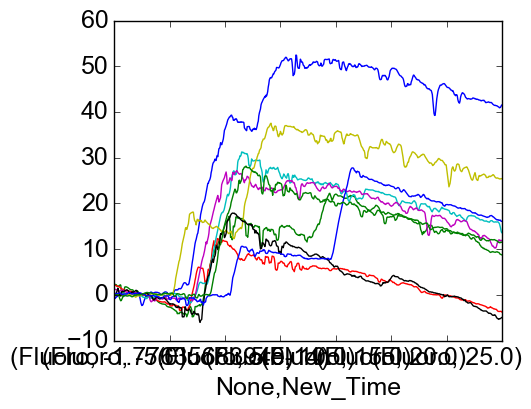

In [11]:
for cell in cellNames:
    plt.figure(figsize=(5,4), facecolor="w", dpi= 150)
    #ax = plt.subplot(111)
    for i in range(1,10):
        df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
        df.loc[cell,i].plot(legend=False)

In [5]:
str(len(eventsData.pivot_table(index=['Cell'], columns='New_Time').index)) + " cells in total."

'36 cells in total.'

In [12]:
startData = markTrials(mice, base, duration, eventType='Eating_Start', trials=trials, baseline=5.0)
contactData = markTrials(mice, base, duration, eventType='Food_Contact', trials=trials, baseline=5.0)

# Calculate the mean and sem
meanstart=startData.pivot_table(index=['Event', 'Cell'], columns='New_Time').mean()
semstart=startData.pivot_table(index=['Event', 'Cell'], columns='New_Time').sem()

meancontact=contactData.pivot_table(index=['Event', 'Cell'], columns='New_Time').mean()
semcontact=contactData.pivot_table(index=['Event', 'Cell'], columns='New_Time').sem()

time = np.arange(-base,duration,fs)

TypeError: markTrials() takes at least 6 arguments (6 given)

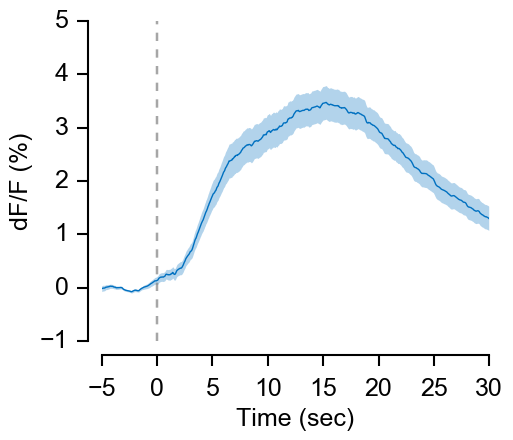

In [6]:
plt.style.use('classic')
# Set the font dictionaries (for plot title and axis titles)
font = {'sans-serif' : 'Arial',
        'weight' : 'normal',
        'size'   : 18}
plt.rc('font', **font)

plt.figure(figsize=(5,4), facecolor="w", dpi= 150)
ax = plt.subplot(111)

line = 1.5
colors = ('#BCBEC0', '#0070C0', '#BCBEC0', '#0070C0')

## labels
ax.set_xlabel("Time (sec)")
ax.set_ylabel("dF/F (%)")
#ax.set_title("Aligned to event::Update the title", fontsize= 12)

## Remove top axes and right axes ticks
ax.get_xaxis().tick_top()
ax.get_yaxis().tick_left()

## adjust the spines and ticks
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.spines['left'].set_linewidth(line)
ax.spines['left'].set_position(('outward', 10))
ax.spines['bottom'].set_linewidth(line)
ax.spines['bottom'].set_position(('outward', 10))
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')

## decorate the axes
ax.tick_params(axis='y', color= '#000000', width= line, direction='out', length= 8, which='major', pad=10)
ax.tick_params(axis='x', color= '#000000', width= line, direction='out', length= 8, which='major', pad=12)

ax.fill_between(time, mean+sem, mean-sem, facecolor=colors[1], linewidth=0, alpha=0.3, zorder=-5)
cat, = ax.plot(time, mean, colors[1], label=eventType)
#ax.fill_between(time, meanstart+semstart, meanstart-semstart, facecolor=colors[1], linewidth=0, alpha=0.3, zorder=-5)
#cat1, = ax.plot(time, meanstart, colors[1], label='Start')
#ax.fill_between(time, meancontact+semcontact, meancontact-semcontact, facecolor=colors[0], linewidth=0, alpha=0.3, zorder=-5)
#cat2, = ax.plot(time, meancontact, colors[0], label='Contact')

ax.plot([0, 0],[-1, 5], 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)
#ax.text(0, 5, eventType)
#ax.set_ylim([-1., 5.])

if False:
    ## add the legend
    ax.legend([cat1, cat2], ['Start', 'Contact'])
    handles, labels = ax.get_legend_handles_labels()
    legend = plt.legend(loc= 'upper left', fontsize= 18, handles=handles, handlelength= 1.2, handleheight= 0.8, handletextpad= 0.5, frameon= False)

#plt.tight_layout()

In [9]:
boutsData = markBouts(mice, eventType=['Eat_Start', 'Eat_End'], behType=behType, trials=[1,12], dff=True, baseline=5.0)


3  mice were loaded.
Mouse number 8404  had  15  total rewards.
Mouse number 8857  had  17  total rewards.
Mouse number 8864  had  13  total rewards.

Baseline was set 5.0 sec before the event.


In [ ]:
boutsData = markBouts(mice, eventType=['Eat_Start', 'Eat_End'], behType=behType, trials=[1,12], resample=1000)

In [12]:
boutsData.pivot_table(index=['Event', 'Cell'], columns='New_Time')

Fluoro            \
New_Time                                                0.00      0.05    
Event Cell                                                                
1     M8404_recording_ICs1 (Fluorescence (au))  -9.593987e-01 -0.960264   
      M8404_recording_ICs11 (Fluorescence (au))  1.405660e+00  1.405660   
      M8404_recording_ICs16 (Fluorescence (au)) -1.793862e+00 -1.963254   
      M8404_recording_ICs17 (Fluorescence (au)) -3.948281e-01 -0.220080   
      M8404_recording_ICs19 (Fluorescence (au))  1.421302e+00  1.721846   
      M8404_recording_ICs2 (Fluorescence (au))   5.155307e+00  5.768031   
      M8404_recording_ICs21 (Fluorescence (au))  1.245878e-01  0.092295   
      M8404_recording_ICs22 (Fluorescence (au))  2.273621e+00  2.236344   
      M8404_recording_ICs25 (Fluorescence (au)) -6.828794e-01 -0.693519   
      M8404_recording_ICs29 (Fluorescence (au))  6.952309e-01  0.722312   
      M8404_recording_ICs3 (Fluorescence (au))  -8.141032e-01 -0.860532   
      M8404_recording_ICs30 (Fluorescence (au)) -6.235569e-01 -0.476144   
      M8404_recording_ICs31 (Fluorescence (au))  8.059126e-01  0.765888   
      M8404_recording_ICs5 (Fluorescence (au))   1.768078e+00  1.762276   
      M8404_recording_ICs8 (Fluorescence (au))   8.336219e-03 -0.002760   
      M8857_recording_ICs10 (Fluorescence (au))  2.081668e-17       NaN   
      M8857_recording_ICs11 (Fluorescence (au))  9.714451e-17       NaN   
      M8857_recording_ICs12 (Fluorescence (au))  3.778840e-01       NaN   
      M8857_recording_ICs13 (Fluorescence (au))  1.184440e-01       NaN   
      M8857_recording_ICs14 (Fluorescence (au))  9.520641e-02       NaN   
      M8857_recording_ICs15 (Fluorescence (au))  1.552823e-01       NaN   
      M8857_recording_ICs17 (Fluorescence (au)) -3.917726e-01       NaN   
      M8857_recording_ICs18 (Fluorescence (au)) -4.374336e-01       NaN   
      M8857_recording_ICs19 (Fluorescence (au)) -1.303403e-01       NaN   
      M8857_recording_ICs2 (Fluorescence (au))  -1.998401e-15       NaN   
      M8857_recording_ICs3 (Fluorescence (au))   7.859069e-01       NaN   
      M8857_recording_ICs4 (Fluorescence (au))   5.952849e-01       NaN   
      M8857_recording_ICs5 (Fluorescence (au))  -2.281443e+00       NaN   
      M8857_recording_ICs6 (Fluorescence (au))   3.462481e-01       NaN   
      M8857_recording_ICs7 (Fluorescence (au))  -8.626997e-02       NaN   
...                                                       ...       ...   
12    M8404_recording_ICs21 (Fluorescence (au)) -7.163452e-02 -0.055811   
      M8404_recording_ICs22 (Fluorescence (au)) -1.229978e-01 -0.057024   
      M8404_recording_ICs25 (Fluorescence (au)) -9.094721e-01 -1.001526   
      M8404_recording_ICs29 (Fluorescence (au)) -6.985397e-01 -0.694026   
      M8404_recording_ICs3 (Fluorescence (au))   4.945040e-02  0.057543   
      M8404_recording_ICs30 (Fluorescence (au))  1.163088e+00  1.310501   
      M8404_recording_ICs31 (Fluorescence (au)) -4.587284e-01 -0.491074   
      M8404_recording_ICs5 (Fluorescence (au))  -3.411798e-01 -0.310925   
      M8404_recording_ICs8 (Fluorescence (au))  -4.765810e-01 -0.480122   
      M8857_recording_ICs10 (Fluorescence (au)) -1.040834e-17       NaN   
      M8857_recording_ICs11 (Fluorescence (au)) -2.332588e-01       NaN   
      M8857_recording_ICs12 (Fluorescence (au)) -6.793790e-01       NaN   
      M8857_recording_ICs13 (Fluorescence (au)) -3.092176e-02       NaN   
      M8857_recording_ICs14 (Fluorescence (au)) -2.260430e-01       NaN   
      M8857_recording_ICs15 (Fluorescence (au)) -6.764054e-01       NaN   
      M8857_recording_ICs17 (Fluorescence (au)) -1.838735e-01       NaN   
      M8857_recording_ICs18 (Fluorescence (au)) -3.118921e-01       NaN   
      M8857_recording_ICs19 (Fluorescence (au)) -5.732561e-01       NaN   
      M8857_recording_ICs2 (Fluorescence (au))  -2.777929e-01       NaN   
      M8857_recording_ICs3 (Fluorescence (au))   1.181702e-01       NaN   
     

600 518


ValueError: Argument dimensions are incompatible

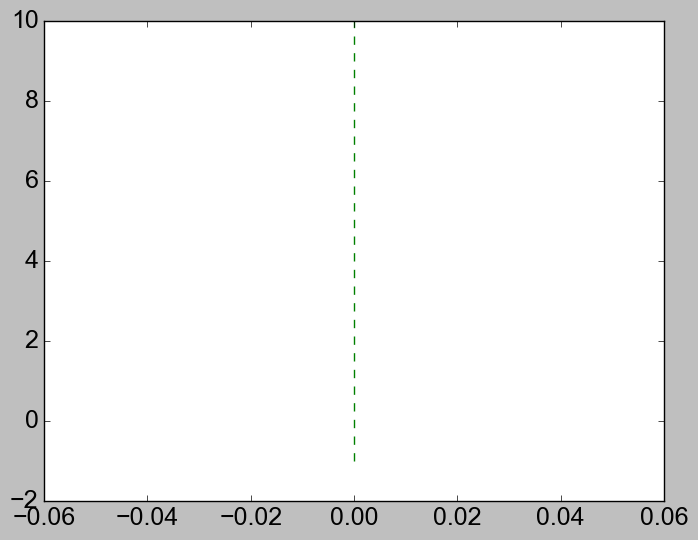

In [11]:
mean=boutsData.pivot_table(index=['Event', 'Cell'], columns='New_Time').mean()
sem=boutsData.pivot_table(index=['Event', 'Cell'], columns='New_Time').sem()

time = np.arange(-base,duration,fs)
print len(time), len(mean)
plt.plot([0, 0],[-1, 10], 'g--')
plt.fill_between(time, mean+sem, mean-sem, facecolor='gray', linewidth=0, alpha=0.3, zorder=-5)
plt.plot(time, mean)

In [ ]:
heatData = eventsData.pivot_table(index=['Event'], columns='New_Time', aggfunc=np.mean)
heatData['Fluoro'].columns
heatData.mean(axis=1)

In [ ]:
plt.style.use('classic')
# Set the font dictionaries (for plot title and axis titles)
font = {'sans-serif' : 'Arial',
        'weight' : 'normal',
        'size'   : 18}
plt.rc('font', **font)

plt.figure(figsize=(6,5), facecolor="w", dpi= 150)
ax = plt.subplot(111)

line = 1.5
colors = ('#BCBEC0', '#0070C0', '#BCBEC0', '#0070C0')

plt.pcolor(heatData, cmap=plt.cm.PiYG_r, linewidth=line, linestyle='solid')
ax.invert_yaxis()
plt.colorbar()

## labels
ax.set_xlabel('Time (sec)')
ax.set_ylabel('Trial #')
ax.set_title(eventType)


## decorate the axes
#ax.tick_params(axis='y', color= '#000000', width= line, direction='in', length= 4, which='major', pad=10)
#ax.tick_params(axis='x', color= '#000000', width= line, direction='in', length= 4, which='major', pad=12)
time_ax = np.arange(-base, duration+0.001, 5.0)
ax.set_xticks(np.linspace(0, (base+duration)/fs, len(time_ax)))
ax.set_xticklabels(time_ax)
ax.set_yticks(np.linspace(trials[0]-0.5, trials[1]-0.5, 2))
ax.set_yticklabels(np.linspace(trials[0], trials[1], 2, dtype=int))

ax.plot([base/fs, base/fs], list(ax.get_ylim()), 'w', linestyle='--', linewidth=line*1.2, alpha=1., zorder=111)

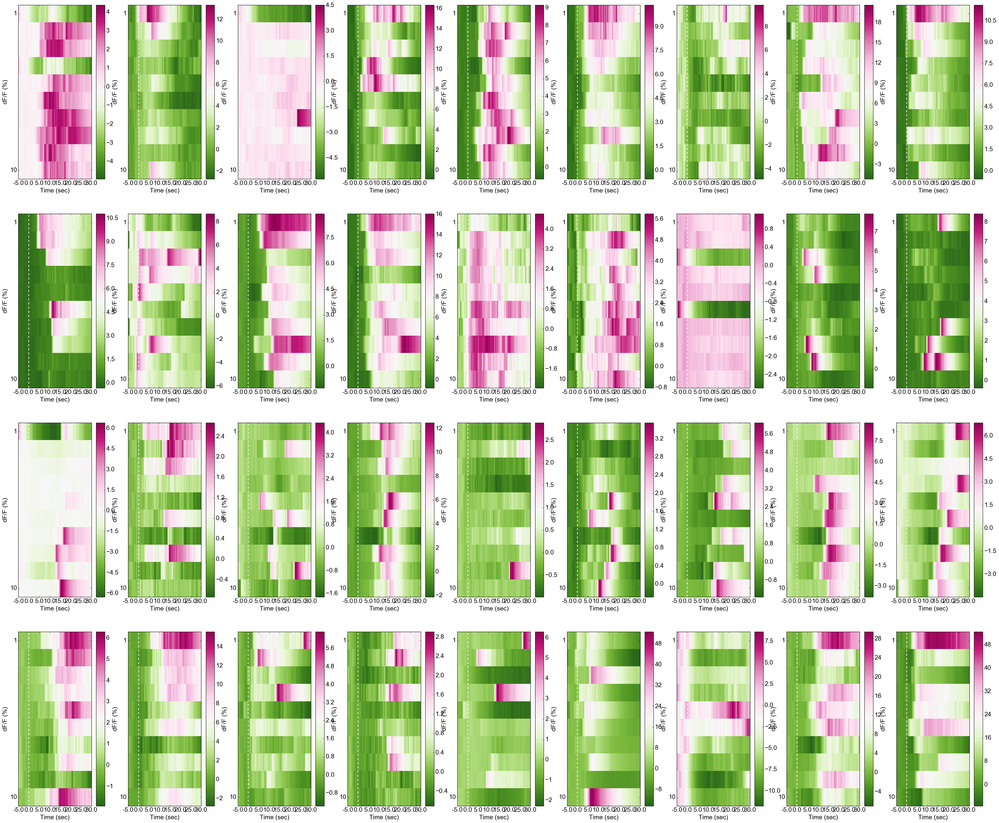

In [33]:
cellNames = eventsData['Cell'].drop_duplicates().values
time = np.arange(-base,duration,fs)

row = 4
plt.figure(figsize=(50,40), facecolor="w", dpi= 150)
for ind, cell in enumerate(cellNames):
    df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
    
    plt.style.use('classic')
    # Set the font dictionaries (for plot title and axis titles)
    font = {'sans-serif' : 'Arial',
            'weight' : 'normal',
            'size'   : 18}
    plt.rc('font', **font)

    line = 1.5
    colors = ('#BCBEC0', '#0070C0', '#BCBEC0', '#0070C0')
    
    ax = plt.subplot(row, len(cellNames)/row, ind+1)
    
    plt.pcolor(df.loc[cell], cmap=plt.cm.PiYG_r, linewidth=line, linestyle='solid')
    ax.invert_yaxis()
    plt.colorbar()
    
    ## labels
    ax.set_xlabel("Time (sec)")
    ax.set_ylabel("dF/F (%)")
    #ax.set_title("Aligned to event::Update the title", fontsize= 12)

    ## decorate the axes
    time_ax = np.arange(-base, duration+0.001, 5.0)
    ax.set_xticks(np.linspace(0, (base+duration)/fs, len(time_ax)))
    ax.set_xticklabels(time_ax)
    ax.set_yticks(np.linspace(trials[0]-0.5, trials[1]-0.5, 2))
    ax.set_yticklabels(np.linspace(trials[0], trials[1], 2, dtype=int))

    ax.plot([base/fs, base/fs], list(ax.get_ylim()), 'w', linestyle='--', linewidth=line*1.2, alpha=1., zorder=111)
